In [1]:

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import os
import cv2
import random
from PIL import Image
import time
from tqdm import tqdm

# Import models and dataset and utils
from SIDD_Dataset import SIDD_Dataset

random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

noisy_img_array = np.load('./data/noisy_img_array.npy', allow_pickle=True)
gt_img_array = np.load('./data/gt_img_array.npy', allow_pickle=True)

# Normalize images to [0, 1] range
noisy_img_array = noisy_img_array.astype(np.float32) / 255.0
gt_img_array = gt_img_array.astype(np.float32) / 255.0

print(noisy_img_array.shape)
print(gt_img_array.shape)

print(np.max(noisy_img_array), np.min(noisy_img_array))
print(np.max(gt_img_array), np.min(gt_img_array))

(160, 1024, 1024, 3)
(160, 1024, 1024, 3)
1.0 0.0
1.0 0.0


## 이미지 캐싱

=== SIDD_Dataset 초기화 (img_size=224) ===
캐시 파일을 로드합니다: ./dataset_cache\sidd_processed_224.pt
캐시 로드 완료. 소요 시간: 0.03초
데이터 크기: 160 샘플, 이미지 크기: 112x112


c:\Workspace\N2N_CA2\SIDD_Dataset.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cache_data = torch.load(cache_file)
Clipping input data to the valid range for imshow 

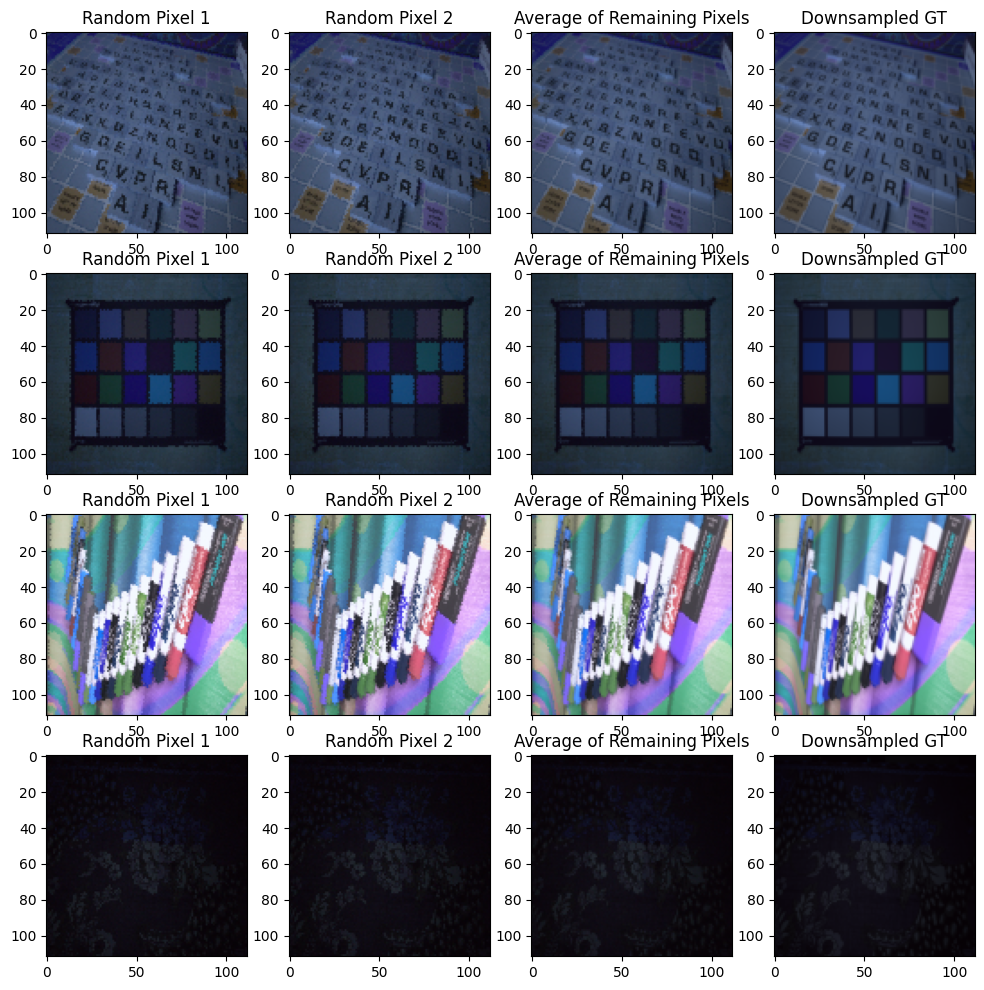

In [2]:
img_size = 224
batch_size = 32

# Prepare dataset and dataloader
dataset = SIDD_Dataset(noisy_img_array, gt_img_array, img_size=img_size)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Get one batch of data
data_iter = iter(dataloader)
img1, img2, img3, downsampled_gt = next(data_iter)

# Display the images in the batch
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for i in range(4):
    axes[i, 0].imshow(img1[i].permute(1, 2, 0).numpy())
    axes[i, 0].set_title('Random Pixel 1')
    axes[i, 1].imshow(img2[i].permute(1, 2, 0).numpy())
    axes[i, 1].set_title('Random Pixel 2')
    axes[i, 2].imshow(img3[i].permute(1, 2, 0).numpy())
    axes[i, 2].set_title('Average of Remaining Pixels')
    axes[i, 3].imshow(downsampled_gt[i].permute(1, 2, 0).numpy())
    axes[i, 3].set_title('Downsampled GT')
plt.show()

In [4]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from models.DnCNN import DnCNN
from models.DnCNN_CA import DnCNN_CA
from SIDD_Dataset import SIDD_Dataset
from train import train
from utils import visualize_input_target_output, measure_model_complexity


def main(num_epochs=50, batch_size=16, learning_rate=0.001, img_size=512, early_stop=10, ca=None):
    """
    학습을 수행하는 메인 함수
    
    Args:
        num_epochs: 훈련 에폭 수
        batch_size: 배치 크기
        learning_rate: 학습률
        noise_level: 노이즈 수준 (모델 저장 파일명에 사용)
        img_size: 이미지 크기
        ca: None 또는 'ca' (채널 어텐션 사용 여부)
    """
    # 디바이스 설정
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"사용 중인 디바이스: {device}")
    
    # 체크포인트 디렉토리 생성
    os.makedirs('./checkpoints', exist_ok=True)
    
    # 데이터 로드
    print("SIDD 데이터셋 로드 중...")
    try:
        # 데이터셋 경로 설정 (실제 경로로 수정 필요)
        data_path = 'data'
        
        # 데이터 로드 (실제 데이터 로드 코드로 대체 필요)
        noisy_data = np.load(f'{data_path}/noisy_img_array.npy', mmap_mode='r')
        gt_data = np.load(f'{data_path}/gt_img_array.npy', mmap_mode='r')
        noisy_data = noisy_data.astype(np.float32) / 255.0
        gt_data = gt_data.astype(np.float32) / 255.0
        
        print(f"데이터 로드 완료: noisy shape {noisy_data.shape}, gt shape {gt_data.shape}")
        
        # 데이터셋 생성
        dataset = SIDD_Dataset(noisy_data, gt_data, img_size=img_size)
        
        # 학습/검증 분할
        train_size = int(0.8 * len(dataset))
        val_size = len(dataset) - train_size
        train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
        
        # 데이터로더 생성
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=0, pin_memory=True)
        
        print(f"학습 샘플 수: {len(train_dataset)}, 검증 샘플 수: {len(val_dataset)}")
        
    except Exception as e:
        print(f"데이터 로드 중 오류 발생: {e}")
        return
    
    # 모델 초기화
    print("모델 초기화 중...")
    if ca == 'ca':
        model = DnCNN_CA(in_channels=6, out_channels=3)
        print("채널 어텐션이 포함된 DnCNN 모델 생성됨")
    else:
        model = DnCNN(in_channels=6, out_channels=3)
        print("기본 DnCNN 모델 생성됨")
    
    # 모델 GFLOPs 계산
    # flops, params = measure_model_complexity(model, img_size=img_size, device=device)
    # flops, params = measure_model_complexity(model, img_size=img_size, device=device)
    # print(f"모델 GFLOPs: {flops / 1e9:.2f} GFLOPs")
    params = sum(p.numel() for p in model.parameters())
    print(f"모델 총 파라미터: {params:,}")
    
    # 옵티마이저 및 손실 함수 설정
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # 학습 시작
    print(f"학습 시작 - {num_epochs} 에폭")
    train_losses, val_losses = train(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=num_epochs,
        device=device,
        early_stop=early_stop,
        ca=ca,
    )
    
    # 최종 모델 저장
    if ca is not None:
        model_name = f'final_dncnn_model_{ca}.pth'
    else:
        model_name = f'final_dncnn_model.pth'
    model_path = os.path.join('./checkpoints', model_name)
    torch.save(model.state_dict(), model_path)
    print(f"최종 모델 저장 완료: {model_path}")
    
    # 최종 결과 시각화
    print("최종 결과 시각화 중...")
    model.eval()
    visualize_input_target_output(model, val_loader, device, num_samples=2)
    
    print("학습 및 평가 완료!")
    return model, train_losses, val_losses

In [5]:
num_epochs = 500  # 학습 에폭 수
batch_size = 4   # 배치 크기
learning_rate = 0.0001  # 학습률
early_stop = 25  # 조기 종료 조건

img_size = 224  # 이미지 크기

사용 중인 디바이스: cuda
SIDD 데이터셋 로드 중...
데이터 로드 완료: noisy shape (160, 1024, 1024, 3), gt shape (160, 1024, 1024, 3)
=== SIDD_Dataset 초기화 (img_size=224) ===
캐시 파일을 로드합니다: ./dataset_cache\sidd_processed_224.pt
캐시 로드 완료. 소요 시간: 0.03초
데이터 크기: 160 샘플, 이미지 크기: 112x112
학습 샘플 수: 128, 검증 샘플 수: 32
모델 초기화 중...
기본 DnCNN 모델 생성됨
모델 총 파라미터: 560,131
학습 시작 - 500 에폭


Epoch 1/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 80.85it/s]


Epoch 1/500 - Train Loss: 0.0873, Val Loss: 0.0448, Val PSNR: 16.62dB
모델 저장됨 (Val Loss: 0.0448)


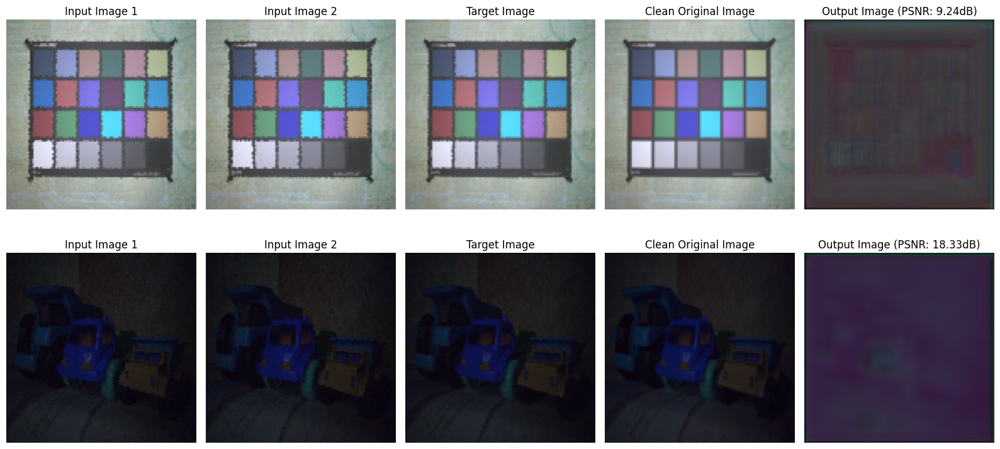

Epoch 2/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.02it/s]


Epoch 2/500 - Train Loss: 0.0186, Val Loss: 0.0091, Val PSNR: 22.06dB
모델 저장됨 (Val Loss: 0.0091)


Epoch 3/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.66it/s]


Epoch 3/500 - Train Loss: 0.0166, Val Loss: 0.0114, Val PSNR: 21.62dB


Epoch 4/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.88it/s]


Epoch 4/500 - Train Loss: 0.0134, Val Loss: 0.0068, Val PSNR: 22.35dB
모델 저장됨 (Val Loss: 0.0068)


Epoch 5/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.72it/s]


Epoch 5/500 - Train Loss: 0.0147, Val Loss: 0.0126, Val PSNR: 21.56dB


Epoch 6/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.45it/s]


Epoch 6/500 - Train Loss: 0.0106, Val Loss: 0.0063, Val PSNR: 22.65dB
모델 저장됨 (Val Loss: 0.0063)


Epoch 7/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.02it/s]


Epoch 7/500 - Train Loss: 0.0105, Val Loss: 0.0057, Val PSNR: 23.25dB
모델 저장됨 (Val Loss: 0.0057)


Epoch 8/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.31it/s]


Epoch 8/500 - Train Loss: 0.0117, Val Loss: 0.0062, Val PSNR: 23.78dB


Epoch 9/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.04it/s]


Epoch 9/500 - Train Loss: 0.0103, Val Loss: 0.0066, Val PSNR: 23.43dB


Epoch 10/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.51it/s]


Epoch 10/500 - Train Loss: 0.0102, Val Loss: 0.0056, Val PSNR: 22.98dB
모델 저장됨 (Val Loss: 0.0056)


Epoch 11/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.80it/s]


Epoch 11/500 - Train Loss: 0.0085, Val Loss: 0.0062, Val PSNR: 24.15dB


Epoch 12/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.37it/s]


Epoch 12/500 - Train Loss: 0.0090, Val Loss: 0.0060, Val PSNR: 23.84dB


Epoch 13/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.57it/s]


Epoch 13/500 - Train Loss: 0.0089, Val Loss: 0.0081, Val PSNR: 22.57dB


Epoch 14/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 101.74it/s]


Epoch 14/500 - Train Loss: 0.0094, Val Loss: 0.0046, Val PSNR: 24.59dB
모델 저장됨 (Val Loss: 0.0046)


Epoch 15/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.65it/s]


Epoch 15/500 - Train Loss: 0.0083, Val Loss: 0.0046, Val PSNR: 24.40dB
모델 저장됨 (Val Loss: 0.0046)


Epoch 16/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.71it/s]


Epoch 16/500 - Train Loss: 0.0070, Val Loss: 0.0038, Val PSNR: 25.00dB
모델 저장됨 (Val Loss: 0.0038)


Epoch 17/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.55it/s]


Epoch 17/500 - Train Loss: 0.0077, Val Loss: 0.0057, Val PSNR: 24.44dB


Epoch 18/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.96it/s]


Epoch 18/500 - Train Loss: 0.0064, Val Loss: 0.0057, Val PSNR: 23.65dB


Epoch 19/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.32it/s]


Epoch 19/500 - Train Loss: 0.0062, Val Loss: 0.0049, Val PSNR: 25.01dB


Epoch 20/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.36it/s]


Epoch 20/500 - Train Loss: 0.0052, Val Loss: 0.0036, Val PSNR: 25.62dB
모델 저장됨 (Val Loss: 0.0036)


Epoch 21/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 138.85it/s]


Epoch 21/500 - Train Loss: 0.0050, Val Loss: 0.0037, Val PSNR: 25.35dB


Epoch 22/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.24it/s]


Epoch 22/500 - Train Loss: 0.0056, Val Loss: 0.0046, Val PSNR: 24.38dB


Epoch 23/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.50it/s]


Epoch 23/500 - Train Loss: 0.0048, Val Loss: 0.0032, Val PSNR: 26.36dB
모델 저장됨 (Val Loss: 0.0032)


Epoch 24/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.87it/s]


Epoch 24/500 - Train Loss: 0.0048, Val Loss: 0.0034, Val PSNR: 25.64dB


Epoch 25/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.05it/s]


Epoch 25/500 - Train Loss: 0.0046, Val Loss: 0.0033, Val PSNR: 26.11dB


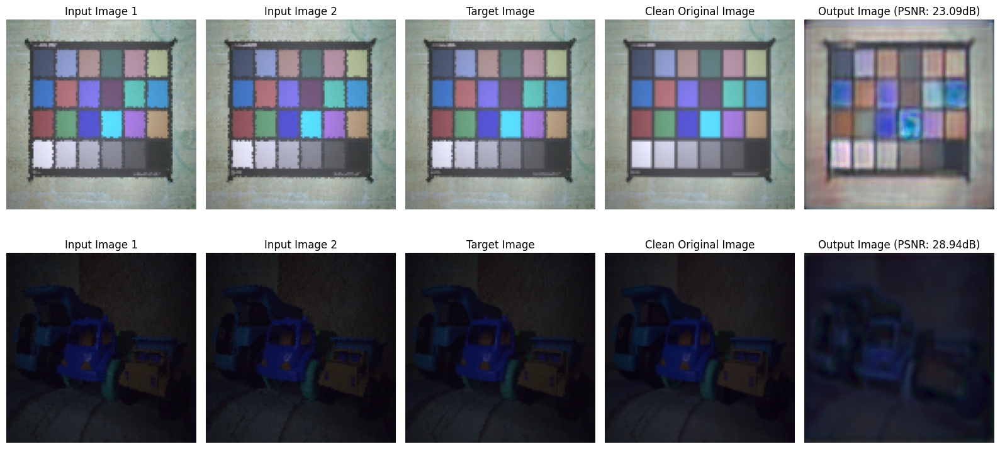

Epoch 26/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.47it/s]


Epoch 26/500 - Train Loss: 0.0049, Val Loss: 0.0034, Val PSNR: 25.80dB


Epoch 27/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.55it/s]


Epoch 27/500 - Train Loss: 0.0038, Val Loss: 0.0029, Val PSNR: 26.24dB
모델 저장됨 (Val Loss: 0.0029)


Epoch 28/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.38it/s]


Epoch 28/500 - Train Loss: 0.0042, Val Loss: 0.0052, Val PSNR: 24.62dB


Epoch 29/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.64it/s]


Epoch 29/500 - Train Loss: 0.0054, Val Loss: 0.0033, Val PSNR: 26.63dB


Epoch 30/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.02it/s]


Epoch 30/500 - Train Loss: 0.0057, Val Loss: 0.0047, Val PSNR: 24.89dB


Epoch 31/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.66it/s]


Epoch 31/500 - Train Loss: 0.0059, Val Loss: 0.0033, Val PSNR: 25.53dB


Epoch 32/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 134.45it/s]


Epoch 32/500 - Train Loss: 0.0059, Val Loss: 0.0126, Val PSNR: 23.33dB


Epoch 33/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.42it/s]


Epoch 33/500 - Train Loss: 0.0046, Val Loss: 0.0045, Val PSNR: 25.70dB


Epoch 34/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.71it/s]


Epoch 34/500 - Train Loss: 0.0049, Val Loss: 0.0030, Val PSNR: 26.70dB


Epoch 35/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.88it/s]


Epoch 35/500 - Train Loss: 0.0049, Val Loss: 0.0039, Val PSNR: 24.67dB


Epoch 36/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.01it/s]


Epoch 36/500 - Train Loss: 0.0054, Val Loss: 0.0034, Val PSNR: 25.63dB


Epoch 37/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.48it/s]


Epoch 37/500 - Train Loss: 0.0042, Val Loss: 0.0036, Val PSNR: 26.50dB


Epoch 38/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 152.24it/s]


Epoch 38/500 - Train Loss: 0.0044, Val Loss: 0.0033, Val PSNR: 26.33dB


Epoch 39/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 142.71it/s]


Epoch 39/500 - Train Loss: 0.0057, Val Loss: 0.0044, Val PSNR: 24.11dB


Epoch 40/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.56it/s]


Epoch 40/500 - Train Loss: 0.0046, Val Loss: 0.0027, Val PSNR: 27.23dB
모델 저장됨 (Val Loss: 0.0027)


Epoch 41/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.55it/s]


Epoch 41/500 - Train Loss: 0.0042, Val Loss: 0.0035, Val PSNR: 25.87dB


Epoch 42/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 151.65it/s]


Epoch 42/500 - Train Loss: 0.0040, Val Loss: 0.0030, Val PSNR: 26.65dB


Epoch 43/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.75it/s]


Epoch 43/500 - Train Loss: 0.0042, Val Loss: 0.0029, Val PSNR: 26.95dB


Epoch 44/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.61it/s]


Epoch 44/500 - Train Loss: 0.0048, Val Loss: 0.0056, Val PSNR: 25.48dB


Epoch 45/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.32it/s]


Epoch 45/500 - Train Loss: 0.0033, Val Loss: 0.0032, Val PSNR: 27.08dB


Epoch 46/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.00it/s]


Epoch 46/500 - Train Loss: 0.0034, Val Loss: 0.0027, Val PSNR: 26.59dB


Epoch 47/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.32it/s]


Epoch 47/500 - Train Loss: 0.0035, Val Loss: 0.0034, Val PSNR: 26.32dB


Epoch 48/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.94it/s]


Epoch 48/500 - Train Loss: 0.0035, Val Loss: 0.0029, Val PSNR: 27.27dB


Epoch 49/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.31it/s]


Epoch 49/500 - Train Loss: 0.0037, Val Loss: 0.0031, Val PSNR: 26.73dB


Epoch 50/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.43it/s]


Epoch 50/500 - Train Loss: 0.0035, Val Loss: 0.0034, Val PSNR: 26.52dB


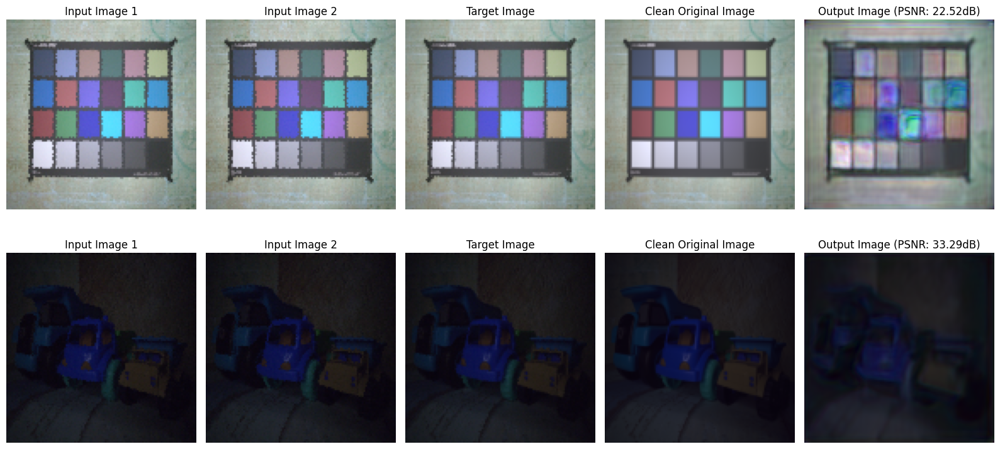

Epoch 51/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 142.70it/s]


Epoch 51/500 - Train Loss: 0.0038, Val Loss: 0.0035, Val PSNR: 26.47dB


Epoch 52/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.00it/s]


Epoch 52/500 - Train Loss: 0.0034, Val Loss: 0.0024, Val PSNR: 27.81dB
모델 저장됨 (Val Loss: 0.0024)


Epoch 53/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.67it/s]


Epoch 53/500 - Train Loss: 0.0033, Val Loss: 0.0033, Val PSNR: 26.82dB


Epoch 54/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.84it/s]


Epoch 54/500 - Train Loss: 0.0039, Val Loss: 0.0029, Val PSNR: 26.61dB


Epoch 55/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.24it/s]


Epoch 55/500 - Train Loss: 0.0033, Val Loss: 0.0062, Val PSNR: 24.71dB


Epoch 56/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.86it/s]


Epoch 56/500 - Train Loss: 0.0036, Val Loss: 0.0025, Val PSNR: 27.49dB


Epoch 57/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.69it/s]


Epoch 57/500 - Train Loss: 0.0031, Val Loss: 0.0042, Val PSNR: 25.70dB


Epoch 58/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 142.35it/s]


Epoch 58/500 - Train Loss: 0.0053, Val Loss: 0.0044, Val PSNR: 26.46dB


Epoch 59/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.10it/s]


Epoch 59/500 - Train Loss: 0.0034, Val Loss: 0.0033, Val PSNR: 26.77dB


Epoch 60/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.73it/s]


Epoch 60/500 - Train Loss: 0.0031, Val Loss: 0.0030, Val PSNR: 26.99dB


Epoch 61/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.61it/s]


Epoch 61/500 - Train Loss: 0.0034, Val Loss: 0.0025, Val PSNR: 27.53dB


Epoch 62/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.82it/s]


Epoch 62/500 - Train Loss: 0.0031, Val Loss: 0.0025, Val PSNR: 27.51dB


Epoch 63/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.82it/s]


Epoch 63/500 - Train Loss: 0.0045, Val Loss: 0.0032, Val PSNR: 26.93dB


Epoch 64/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.80it/s]


Epoch 64/500 - Train Loss: 0.0037, Val Loss: 0.0027, Val PSNR: 27.32dB


Epoch 65/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.40it/s]


Epoch 65/500 - Train Loss: 0.0033, Val Loss: 0.0045, Val PSNR: 25.74dB


Epoch 66/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.99it/s]


Epoch 66/500 - Train Loss: 0.0034, Val Loss: 0.0025, Val PSNR: 27.70dB


Epoch 67/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.55it/s]


Epoch 67/500 - Train Loss: 0.0027, Val Loss: 0.0024, Val PSNR: 27.87dB
모델 저장됨 (Val Loss: 0.0024)


Epoch 68/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.45it/s]


Epoch 68/500 - Train Loss: 0.0026, Val Loss: 0.0033, Val PSNR: 26.72dB


Epoch 69/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.88it/s]


Epoch 69/500 - Train Loss: 0.0030, Val Loss: 0.0023, Val PSNR: 27.93dB
모델 저장됨 (Val Loss: 0.0023)


Epoch 70/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.37it/s]


Epoch 70/500 - Train Loss: 0.0032, Val Loss: 0.0021, Val PSNR: 28.15dB
모델 저장됨 (Val Loss: 0.0021)


Epoch 71/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.44it/s]


Epoch 71/500 - Train Loss: 0.0024, Val Loss: 0.0024, Val PSNR: 27.54dB


Epoch 72/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 108.31it/s]


Epoch 72/500 - Train Loss: 0.0028, Val Loss: 0.0020, Val PSNR: 28.25dB
모델 저장됨 (Val Loss: 0.0020)


Epoch 73/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.27it/s]


Epoch 73/500 - Train Loss: 0.0026, Val Loss: 0.0026, Val PSNR: 27.57dB


Epoch 74/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.78it/s]


Epoch 74/500 - Train Loss: 0.0025, Val Loss: 0.0023, Val PSNR: 28.29dB


Epoch 75/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.30it/s]


Epoch 75/500 - Train Loss: 0.0022, Val Loss: 0.0023, Val PSNR: 27.87dB


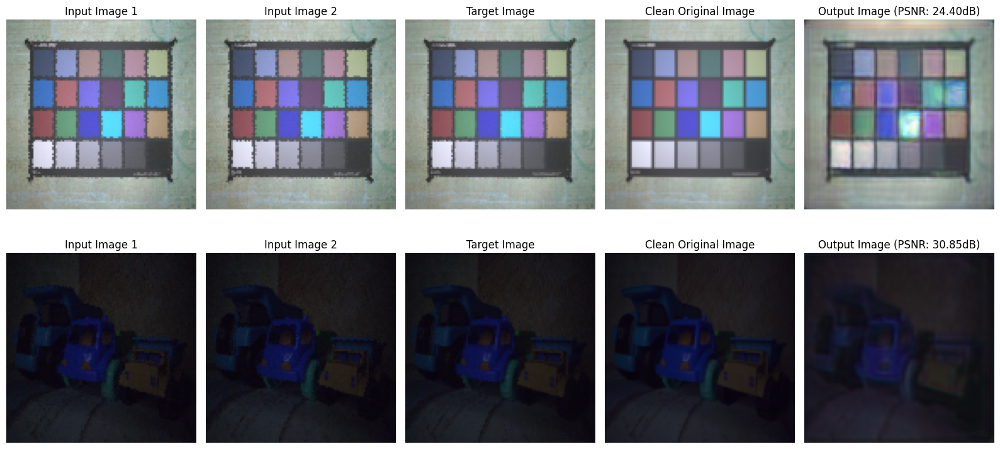

Epoch 76/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.61it/s]


Epoch 76/500 - Train Loss: 0.0026, Val Loss: 0.0025, Val PSNR: 27.68dB


Epoch 77/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.60it/s]


Epoch 77/500 - Train Loss: 0.0027, Val Loss: 0.0023, Val PSNR: 28.01dB


Epoch 78/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.85it/s]


Epoch 78/500 - Train Loss: 0.0025, Val Loss: 0.0020, Val PSNR: 28.04dB


Epoch 79/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.01it/s]


Epoch 79/500 - Train Loss: 0.0026, Val Loss: 0.0029, Val PSNR: 27.52dB


Epoch 80/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.04it/s]


Epoch 80/500 - Train Loss: 0.0028, Val Loss: 0.0019, Val PSNR: 28.77dB
모델 저장됨 (Val Loss: 0.0019)


Epoch 81/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.35it/s]


Epoch 81/500 - Train Loss: 0.0028, Val Loss: 0.0041, Val PSNR: 26.08dB


Epoch 82/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.64it/s]


Epoch 82/500 - Train Loss: 0.0029, Val Loss: 0.0023, Val PSNR: 28.57dB


Epoch 83/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.97it/s]


Epoch 83/500 - Train Loss: 0.0026, Val Loss: 0.0025, Val PSNR: 28.14dB


Epoch 84/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 138.78it/s]


Epoch 84/500 - Train Loss: 0.0029, Val Loss: 0.0035, Val PSNR: 26.35dB


Epoch 85/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.66it/s]


Epoch 85/500 - Train Loss: 0.0027, Val Loss: 0.0023, Val PSNR: 28.21dB


Epoch 86/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.49it/s]


Epoch 86/500 - Train Loss: 0.0027, Val Loss: 0.0028, Val PSNR: 27.27dB


Epoch 87/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.46it/s]


Epoch 87/500 - Train Loss: 0.0027, Val Loss: 0.0023, Val PSNR: 28.01dB


Epoch 88/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 142.72it/s]


Epoch 88/500 - Train Loss: 0.0027, Val Loss: 0.0022, Val PSNR: 28.32dB


Epoch 89/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.22it/s]


Epoch 89/500 - Train Loss: 0.0026, Val Loss: 0.0026, Val PSNR: 28.21dB


Epoch 90/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.21it/s]


Epoch 90/500 - Train Loss: 0.0025, Val Loss: 0.0017, Val PSNR: 29.03dB
모델 저장됨 (Val Loss: 0.0017)


Epoch 91/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.20it/s]


Epoch 91/500 - Train Loss: 0.0023, Val Loss: 0.0019, Val PSNR: 28.84dB


Epoch 92/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.11it/s]


Epoch 92/500 - Train Loss: 0.0021, Val Loss: 0.0023, Val PSNR: 28.00dB


Epoch 93/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.48it/s]


Epoch 93/500 - Train Loss: 0.0023, Val Loss: 0.0025, Val PSNR: 27.86dB


Epoch 94/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.88it/s]


Epoch 94/500 - Train Loss: 0.0024, Val Loss: 0.0023, Val PSNR: 27.76dB


Epoch 95/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.45it/s]


Epoch 95/500 - Train Loss: 0.0021, Val Loss: 0.0022, Val PSNR: 28.47dB


Epoch 96/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 104.72it/s]


Epoch 96/500 - Train Loss: 0.0023, Val Loss: 0.0026, Val PSNR: 27.73dB


Epoch 97/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.76it/s]


Epoch 97/500 - Train Loss: 0.0022, Val Loss: 0.0019, Val PSNR: 28.77dB


Epoch 98/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.04it/s]


Epoch 98/500 - Train Loss: 0.0021, Val Loss: 0.0018, Val PSNR: 28.78dB


Epoch 99/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.26it/s]


Epoch 99/500 - Train Loss: 0.0029, Val Loss: 0.0078, Val PSNR: 24.72dB


Epoch 100/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.18it/s]


Epoch 100/500 - Train Loss: 0.0025, Val Loss: 0.0017, Val PSNR: 29.11dB
모델 저장됨 (Val Loss: 0.0017)


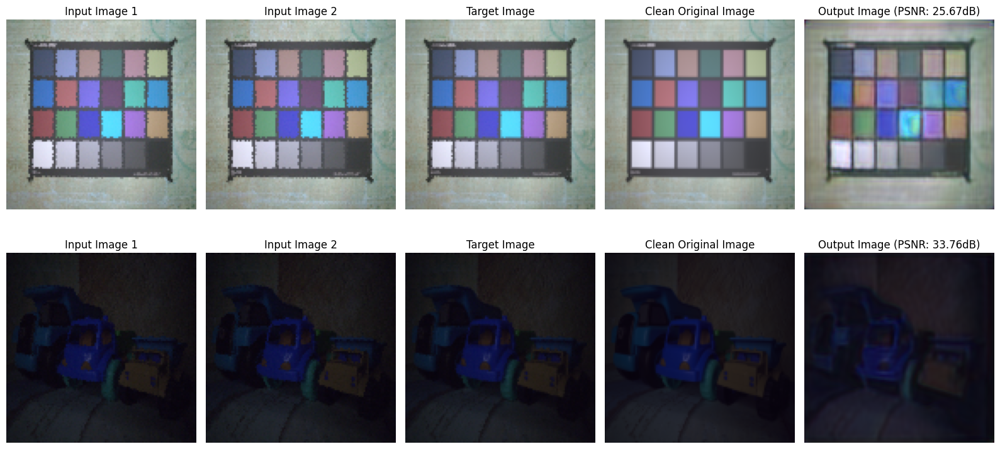

Epoch 101/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.39it/s]


Epoch 101/500 - Train Loss: 0.0021, Val Loss: 0.0025, Val PSNR: 27.65dB


Epoch 102/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.34it/s]


Epoch 102/500 - Train Loss: 0.0020, Val Loss: 0.0019, Val PSNR: 28.63dB


Epoch 103/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.24it/s]


Epoch 103/500 - Train Loss: 0.0022, Val Loss: 0.0018, Val PSNR: 28.93dB


Epoch 104/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.71it/s]


Epoch 104/500 - Train Loss: 0.0025, Val Loss: 0.0021, Val PSNR: 28.30dB


Epoch 105/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.15it/s]


Epoch 105/500 - Train Loss: 0.0024, Val Loss: 0.0030, Val PSNR: 27.86dB


Epoch 106/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.40it/s]


Epoch 106/500 - Train Loss: 0.0024, Val Loss: 0.0088, Val PSNR: 25.00dB


Epoch 107/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.82it/s]


Epoch 107/500 - Train Loss: 0.0028, Val Loss: 0.0022, Val PSNR: 28.42dB


Epoch 108/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.40it/s]


Epoch 108/500 - Train Loss: 0.0024, Val Loss: 0.0018, Val PSNR: 28.92dB


Epoch 109/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.12it/s]


Epoch 109/500 - Train Loss: 0.0024, Val Loss: 0.0029, Val PSNR: 27.64dB


Epoch 110/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.98it/s]


Epoch 110/500 - Train Loss: 0.0022, Val Loss: 0.0019, Val PSNR: 29.08dB


Epoch 111/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.68it/s]


Epoch 111/500 - Train Loss: 0.0023, Val Loss: 0.0017, Val PSNR: 28.86dB


Epoch 112/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.65it/s]


Epoch 112/500 - Train Loss: 0.0026, Val Loss: 0.0055, Val PSNR: 25.55dB


Epoch 113/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.84it/s]


Epoch 113/500 - Train Loss: 0.0026, Val Loss: 0.0021, Val PSNR: 28.46dB


Epoch 114/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.95it/s]


Epoch 114/500 - Train Loss: 0.0027, Val Loss: 0.0019, Val PSNR: 28.73dB


Epoch 115/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.43it/s]


Epoch 115/500 - Train Loss: 0.0023, Val Loss: 0.0021, Val PSNR: 28.36dB


Epoch 116/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.48it/s]


Epoch 116/500 - Train Loss: 0.0025, Val Loss: 0.0030, Val PSNR: 27.26dB


Epoch 117/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.48it/s]


Epoch 117/500 - Train Loss: 0.0026, Val Loss: 0.0017, Val PSNR: 28.98dB


Epoch 118/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.32it/s]


Epoch 118/500 - Train Loss: 0.0027, Val Loss: 0.0025, Val PSNR: 27.80dB


Epoch 119/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.78it/s]


Epoch 119/500 - Train Loss: 0.0029, Val Loss: 0.0020, Val PSNR: 28.68dB


Epoch 120/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.38it/s]


Epoch 120/500 - Train Loss: 0.0026, Val Loss: 0.0034, Val PSNR: 26.93dB


Epoch 121/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.27it/s]


Epoch 121/500 - Train Loss: 0.0025, Val Loss: 0.0027, Val PSNR: 27.41dB


Epoch 122/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.59it/s]


Epoch 122/500 - Train Loss: 0.0028, Val Loss: 0.0025, Val PSNR: 27.73dB


Epoch 123/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.32it/s]


Epoch 123/500 - Train Loss: 0.0023, Val Loss: 0.0021, Val PSNR: 28.18dB


Epoch 124/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.50it/s]


Epoch 124/500 - Train Loss: 0.0021, Val Loss: 0.0016, Val PSNR: 29.53dB
모델 저장됨 (Val Loss: 0.0016)


Epoch 125/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.34it/s]


Epoch 125/500 - Train Loss: 0.0020, Val Loss: 0.0023, Val PSNR: 28.02dB


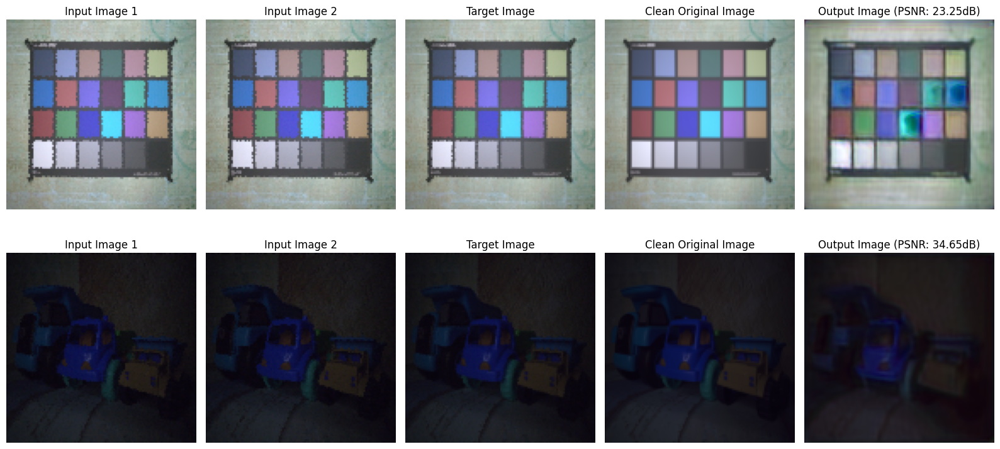

Epoch 126/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.99it/s]


Epoch 126/500 - Train Loss: 0.0020, Val Loss: 0.0018, Val PSNR: 28.70dB


Epoch 127/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.34it/s]


Epoch 127/500 - Train Loss: 0.0020, Val Loss: 0.0018, Val PSNR: 29.21dB


Epoch 128/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 141.44it/s]


Epoch 128/500 - Train Loss: 0.0022, Val Loss: 0.0023, Val PSNR: 27.91dB


Epoch 129/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.58it/s]


Epoch 129/500 - Train Loss: 0.0026, Val Loss: 0.4649, Val PSNR: 13.51dB


Epoch 130/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 150.77it/s]


Epoch 130/500 - Train Loss: 0.0040, Val Loss: 0.0041, Val PSNR: 26.47dB


Epoch 131/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.74it/s]


Epoch 131/500 - Train Loss: 0.0031, Val Loss: 0.0022, Val PSNR: 28.34dB


Epoch 132/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 144.66it/s]


Epoch 132/500 - Train Loss: 0.0030, Val Loss: 0.0027, Val PSNR: 28.14dB


Epoch 133/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.33it/s]


Epoch 133/500 - Train Loss: 0.0029, Val Loss: 0.0023, Val PSNR: 27.32dB


Epoch 134/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.41it/s]


Epoch 134/500 - Train Loss: 0.0046, Val Loss: 0.0030, Val PSNR: 25.78dB


Epoch 135/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 143.71it/s]


Epoch 135/500 - Train Loss: 0.0035, Val Loss: 0.0039, Val PSNR: 25.95dB


Epoch 136/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.33it/s]


Epoch 136/500 - Train Loss: 0.0025, Val Loss: 0.0023, Val PSNR: 28.13dB


Epoch 137/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 146.66it/s]


Epoch 137/500 - Train Loss: 0.0026, Val Loss: 0.0020, Val PSNR: 28.42dB


Epoch 138/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 142.90it/s]


Epoch 138/500 - Train Loss: 0.0027, Val Loss: 0.0022, Val PSNR: 27.60dB


Epoch 139/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.40it/s]


Epoch 139/500 - Train Loss: 0.0034, Val Loss: 0.0020, Val PSNR: 28.82dB


Epoch 140/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.53it/s]


Epoch 140/500 - Train Loss: 0.0029, Val Loss: 0.0034, Val PSNR: 26.61dB


Epoch 141/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.19it/s]


Epoch 141/500 - Train Loss: 0.0023, Val Loss: 0.0017, Val PSNR: 29.25dB


Epoch 142/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 148.66it/s]


Epoch 142/500 - Train Loss: 0.0022, Val Loss: 0.0022, Val PSNR: 28.17dB


Epoch 143/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 123.20it/s]


Epoch 143/500 - Train Loss: 0.0029, Val Loss: 0.0051, Val PSNR: 26.03dB


Epoch 144/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.79it/s]


Epoch 144/500 - Train Loss: 0.0027, Val Loss: 0.0033, Val PSNR: 27.16dB


Epoch 145/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 137.59it/s]


Epoch 145/500 - Train Loss: 0.0024, Val Loss: 0.0020, Val PSNR: 28.96dB


Epoch 146/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.78it/s]


Epoch 146/500 - Train Loss: 0.0022, Val Loss: 0.0021, Val PSNR: 28.03dB


Epoch 147/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 149.34it/s]


Epoch 147/500 - Train Loss: 0.0018, Val Loss: 0.0018, Val PSNR: 29.66dB


Epoch 148/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 145.15it/s]


Epoch 148/500 - Train Loss: 0.0018, Val Loss: 0.0018, Val PSNR: 29.04dB


Epoch 149/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 147.90it/s]


Epoch 149/500 - Train Loss: 0.0018, Val Loss: 0.0023, Val PSNR: 28.73dB
조기 종료 (25 에폭 동안 검증 손실이 감소하지 않음)


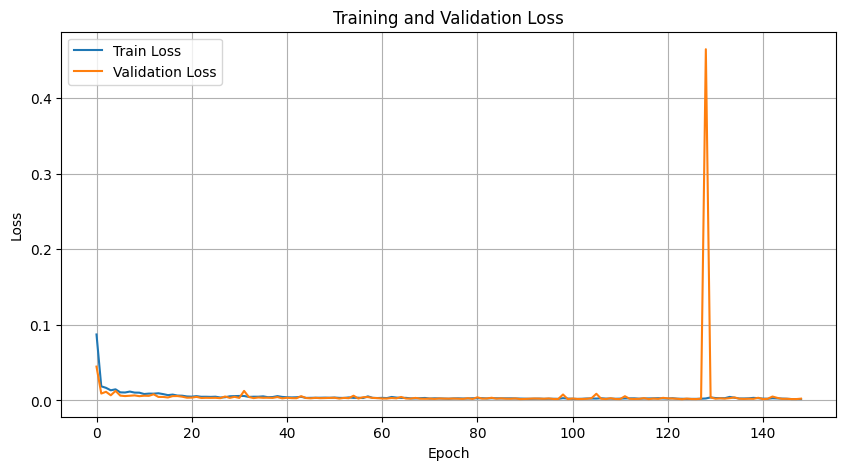

최종 모델 저장 완료: ./checkpoints\final_dncnn_model.pth
최종 결과 시각화 중...


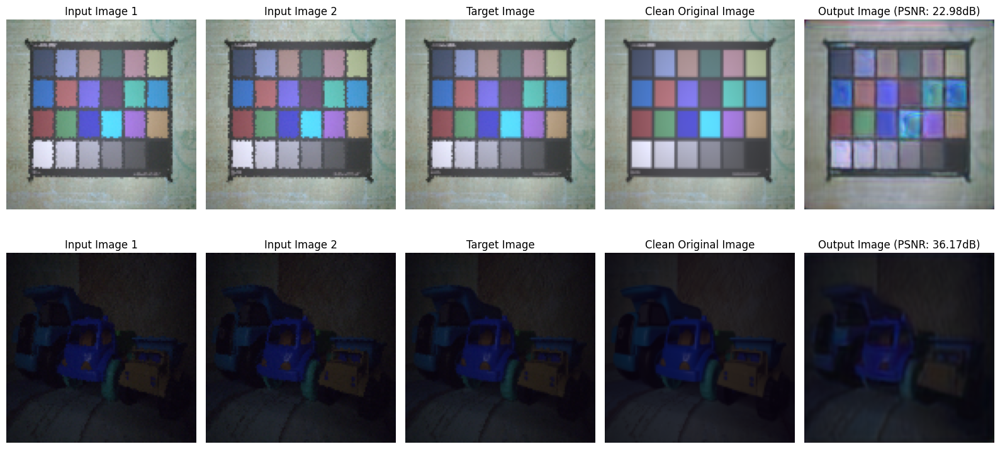

학습 및 평가 완료!


In [5]:

# 실행 코드
if __name__ == "__main__":
    # 하이퍼파라미터 설정
    num_epochs = num_epochs  # 학습 에폭 수
    batch_size = batch_size   # 배치 크기
    learning_rate = learning_rate  # 학습률
    img_size = img_size  # 이미지 크기
    ca = None  # 'ca'로 설정하면 채널 어텐션 모델 사용
    early_stop = early_stop
    
    # 학습 실행
    model, train_losses, val_losses = main(
        num_epochs=num_epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        img_size=img_size,
        early_stop=early_stop,
        ca=ca
    )

In [6]:
import torch

torch.cuda.empty_cache()
print("GPU memory cleared.")

GPU memory cleared.


사용 중인 디바이스: cuda
SIDD 데이터셋 로드 중...
데이터 로드 완료: noisy shape (160, 1024, 1024, 3), gt shape (160, 1024, 1024, 3)
=== SIDD_Dataset 초기화 (img_size=224) ===
캐시 파일을 로드합니다: ./dataset_cache\sidd_processed_224.pt
캐시 로드 완료. 소요 시간: 0.03초
데이터 크기: 160 샘플, 이미지 크기: 112x112
학습 샘플 수: 128, 검증 샘플 수: 32
모델 초기화 중...
채널 어텐션이 포함된 DnCNN 모델 생성됨
모델 총 파라미터: 495,555
학습 시작 - 500 에폭


Epoch 1/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.09it/s]


Epoch 1/500 - Train Loss: 0.0409, Val Loss: 0.0435, Val PSNR: 16.59dB
모델 저장됨 (Val Loss: 0.0435)


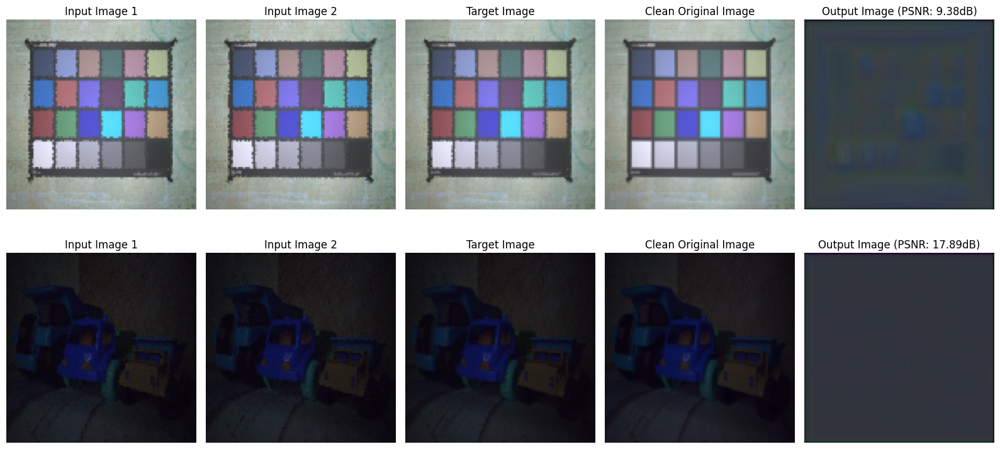

Epoch 2/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.09it/s]


Epoch 2/500 - Train Loss: 0.0101, Val Loss: 0.0152, Val PSNR: 21.25dB
모델 저장됨 (Val Loss: 0.0152)


Epoch 3/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 3/500 - Train Loss: 0.0120, Val Loss: 0.0052, Val PSNR: 24.22dB
모델 저장됨 (Val Loss: 0.0052)


Epoch 4/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 4/500 - Train Loss: 0.0113, Val Loss: 0.0077, Val PSNR: 23.19dB


Epoch 5/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 5/500 - Train Loss: 0.0116, Val Loss: 0.0047, Val PSNR: 24.43dB
모델 저장됨 (Val Loss: 0.0047)


Epoch 6/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.00it/s]


Epoch 6/500 - Train Loss: 0.0111, Val Loss: 0.0040, Val PSNR: 25.03dB
모델 저장됨 (Val Loss: 0.0040)


Epoch 7/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 7/500 - Train Loss: 0.0075, Val Loss: 0.0038, Val PSNR: 24.90dB
모델 저장됨 (Val Loss: 0.0038)


Epoch 8/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 8/500 - Train Loss: 0.0102, Val Loss: 0.0044, Val PSNR: 23.95dB


Epoch 9/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 9/500 - Train Loss: 0.0102, Val Loss: 0.0057, Val PSNR: 23.80dB


Epoch 10/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 10/500 - Train Loss: 0.0073, Val Loss: 0.0043, Val PSNR: 24.02dB


Epoch 11/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 11/500 - Train Loss: 0.0091, Val Loss: 0.0052, Val PSNR: 23.98dB


Epoch 12/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 12/500 - Train Loss: 0.0070, Val Loss: 0.0035, Val PSNR: 25.50dB
모델 저장됨 (Val Loss: 0.0035)


Epoch 13/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 13/500 - Train Loss: 0.0061, Val Loss: 0.0036, Val PSNR: 24.52dB


Epoch 14/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 14/500 - Train Loss: 0.0071, Val Loss: 0.0187, Val PSNR: 21.81dB


Epoch 15/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.07it/s]


Epoch 15/500 - Train Loss: 0.0064, Val Loss: 0.0053, Val PSNR: 24.56dB


Epoch 16/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.05it/s]


Epoch 16/500 - Train Loss: 0.0069, Val Loss: 0.0039, Val PSNR: 24.66dB


Epoch 17/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.07it/s]


Epoch 17/500 - Train Loss: 0.0075, Val Loss: 0.0097, Val PSNR: 21.41dB


Epoch 18/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]


Epoch 18/500 - Train Loss: 0.0089, Val Loss: 0.0106, Val PSNR: 21.37dB


Epoch 19/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.04it/s]


Epoch 19/500 - Train Loss: 0.0045, Val Loss: 0.0079, Val PSNR: 23.72dB


Epoch 20/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 20/500 - Train Loss: 0.0055, Val Loss: 0.0045, Val PSNR: 25.52dB


Epoch 21/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 21/500 - Train Loss: 0.0046, Val Loss: 0.0034, Val PSNR: 26.42dB
모델 저장됨 (Val Loss: 0.0034)


Epoch 22/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 22/500 - Train Loss: 0.0043, Val Loss: 0.0039, Val PSNR: 26.49dB


Epoch 23/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.10it/s]


Epoch 23/500 - Train Loss: 0.0040, Val Loss: 0.0045, Val PSNR: 24.75dB


Epoch 24/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.10it/s]


Epoch 24/500 - Train Loss: 0.0033, Val Loss: 0.0062, Val PSNR: 25.83dB


Epoch 25/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.06it/s]


Epoch 25/500 - Train Loss: 0.0047, Val Loss: 0.0033, Val PSNR: 24.96dB
모델 저장됨 (Val Loss: 0.0033)


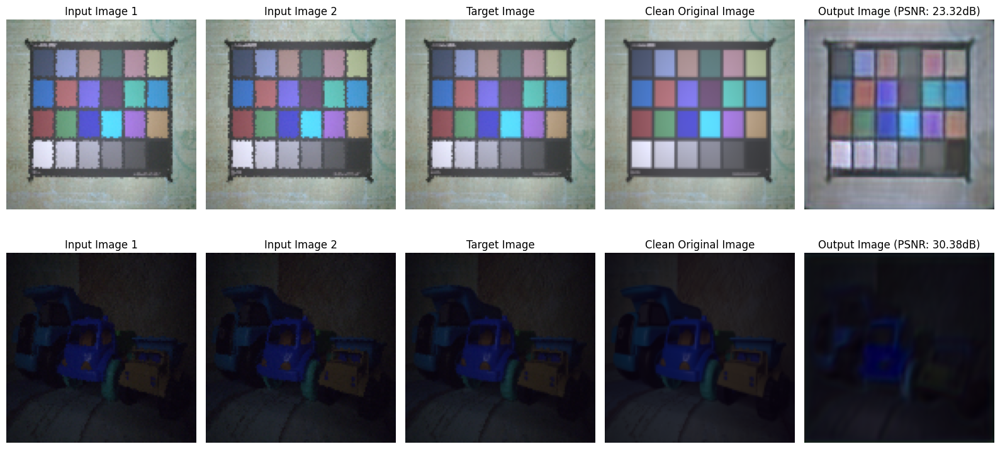

Epoch 26/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 26/500 - Train Loss: 0.0037, Val Loss: 0.0028, Val PSNR: 26.96dB
모델 저장됨 (Val Loss: 0.0028)


Epoch 27/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 27/500 - Train Loss: 0.0062, Val Loss: 0.0069, Val PSNR: 24.17dB


Epoch 28/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]


Epoch 28/500 - Train Loss: 0.0039, Val Loss: 0.0027, Val PSNR: 26.57dB
모델 저장됨 (Val Loss: 0.0027)


Epoch 29/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 29/500 - Train Loss: 0.0041, Val Loss: 0.0029, Val PSNR: 27.59dB


Epoch 30/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 30/500 - Train Loss: 0.0035, Val Loss: 0.0026, Val PSNR: 27.33dB
모델 저장됨 (Val Loss: 0.0026)


Epoch 31/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 31/500 - Train Loss: 0.0034, Val Loss: 0.0040, Val PSNR: 26.17dB


Epoch 32/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.00it/s]


Epoch 32/500 - Train Loss: 0.0034, Val Loss: 0.0047, Val PSNR: 26.17dB


Epoch 33/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 33/500 - Train Loss: 0.0036, Val Loss: 0.0037, Val PSNR: 26.07dB


Epoch 34/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 34/500 - Train Loss: 0.0035, Val Loss: 0.0038, Val PSNR: 27.13dB


Epoch 35/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.10it/s]


Epoch 35/500 - Train Loss: 0.0032, Val Loss: 0.0040, Val PSNR: 25.56dB


Epoch 36/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 36/500 - Train Loss: 0.0058, Val Loss: 0.0033, Val PSNR: 26.44dB


Epoch 37/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 37/500 - Train Loss: 0.0040, Val Loss: 0.0035, Val PSNR: 27.10dB


Epoch 38/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.90it/s]


Epoch 38/500 - Train Loss: 0.0038, Val Loss: 0.0040, Val PSNR: 26.17dB


Epoch 39/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 39/500 - Train Loss: 0.0031, Val Loss: 0.0082, Val PSNR: 23.87dB


Epoch 40/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 40/500 - Train Loss: 0.0040, Val Loss: 0.0029, Val PSNR: 26.48dB


Epoch 41/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 41/500 - Train Loss: 0.0034, Val Loss: 0.0022, Val PSNR: 27.58dB
모델 저장됨 (Val Loss: 0.0022)


Epoch 42/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 42/500 - Train Loss: 0.0039, Val Loss: 0.0031, Val PSNR: 26.74dB


Epoch 43/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 43/500 - Train Loss: 0.0027, Val Loss: 0.0034, Val PSNR: 27.65dB


Epoch 44/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 44/500 - Train Loss: 0.0034, Val Loss: 0.0024, Val PSNR: 27.00dB


Epoch 45/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 45/500 - Train Loss: 0.0030, Val Loss: 0.0031, Val PSNR: 26.45dB


Epoch 46/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 46/500 - Train Loss: 0.0025, Val Loss: 0.0024, Val PSNR: 27.74dB


Epoch 47/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 47/500 - Train Loss: 0.0026, Val Loss: 0.0022, Val PSNR: 27.53dB
모델 저장됨 (Val Loss: 0.0022)


Epoch 48/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 48/500 - Train Loss: 0.0026, Val Loss: 0.0025, Val PSNR: 27.70dB


Epoch 49/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 49/500 - Train Loss: 0.0031, Val Loss: 0.0020, Val PSNR: 28.51dB
모델 저장됨 (Val Loss: 0.0020)


Epoch 50/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 50/500 - Train Loss: 0.0024, Val Loss: 0.0020, Val PSNR: 28.40dB


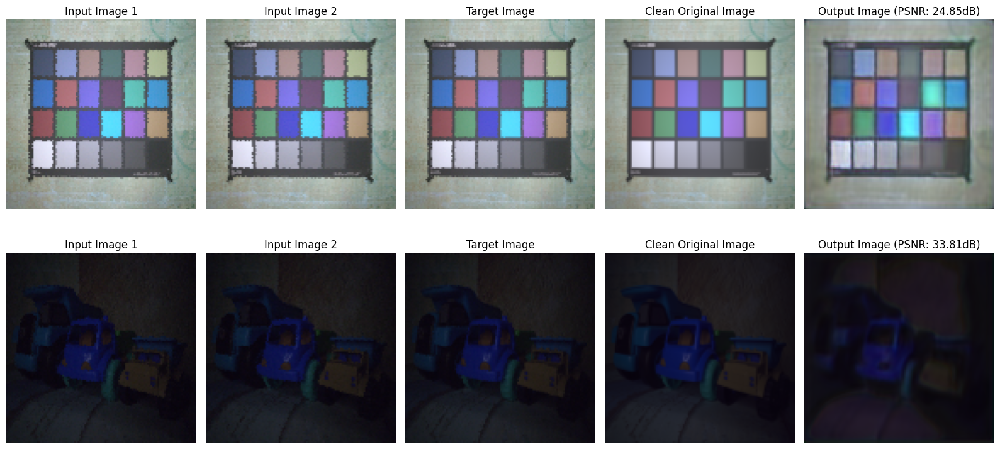

Epoch 51/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 51/500 - Train Loss: 0.0027, Val Loss: 0.0020, Val PSNR: 28.57dB
모델 저장됨 (Val Loss: 0.0020)


Epoch 52/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 52/500 - Train Loss: 0.0025, Val Loss: 0.0023, Val PSNR: 27.14dB


Epoch 53/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 53/500 - Train Loss: 0.0026, Val Loss: 0.0029, Val PSNR: 28.36dB


Epoch 54/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 54/500 - Train Loss: 0.0027, Val Loss: 0.0026, Val PSNR: 27.35dB


Epoch 55/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 55/500 - Train Loss: 0.0024, Val Loss: 0.0051, Val PSNR: 25.83dB


Epoch 56/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 56/500 - Train Loss: 0.0024, Val Loss: 0.0028, Val PSNR: 27.29dB


Epoch 57/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 57/500 - Train Loss: 0.0023, Val Loss: 0.0026, Val PSNR: 27.24dB


Epoch 58/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 58/500 - Train Loss: 0.0025, Val Loss: 0.0019, Val PSNR: 27.75dB
모델 저장됨 (Val Loss: 0.0019)


Epoch 59/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.88it/s]


Epoch 59/500 - Train Loss: 0.0031, Val Loss: 0.0024, Val PSNR: 28.47dB


Epoch 60/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 60/500 - Train Loss: 0.0024, Val Loss: 0.0021, Val PSNR: 28.53dB


Epoch 61/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 61/500 - Train Loss: 0.0028, Val Loss: 0.0021, Val PSNR: 27.72dB


Epoch 62/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 62/500 - Train Loss: 0.0029, Val Loss: 0.0021, Val PSNR: 28.98dB


Epoch 63/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 63/500 - Train Loss: 0.0031, Val Loss: 0.0019, Val PSNR: 28.84dB


Epoch 64/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 64/500 - Train Loss: 0.0032, Val Loss: 0.0024, Val PSNR: 27.06dB


Epoch 65/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.90it/s]


Epoch 65/500 - Train Loss: 0.0029, Val Loss: 0.0020, Val PSNR: 28.53dB


Epoch 66/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 66/500 - Train Loss: 0.0026, Val Loss: 0.0029, Val PSNR: 26.91dB


Epoch 67/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.90it/s]


Epoch 67/500 - Train Loss: 0.0032, Val Loss: 0.0032, Val PSNR: 27.62dB


Epoch 68/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 68/500 - Train Loss: 0.0026, Val Loss: 0.0042, Val PSNR: 26.89dB


Epoch 69/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 69/500 - Train Loss: 0.0024, Val Loss: 0.0024, Val PSNR: 27.18dB


Epoch 70/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 70/500 - Train Loss: 0.0027, Val Loss: 0.0020, Val PSNR: 28.15dB


Epoch 71/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 71/500 - Train Loss: 0.0022, Val Loss: 0.0021, Val PSNR: 28.09dB


Epoch 72/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 72/500 - Train Loss: 0.0027, Val Loss: 0.0026, Val PSNR: 27.32dB


Epoch 73/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 73/500 - Train Loss: 0.0022, Val Loss: 0.0017, Val PSNR: 28.68dB
모델 저장됨 (Val Loss: 0.0017)


Epoch 74/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.88it/s]


Epoch 74/500 - Train Loss: 0.0031, Val Loss: 0.0039, Val PSNR: 25.39dB


Epoch 75/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.90it/s]


Epoch 75/500 - Train Loss: 0.0036, Val Loss: 0.0020, Val PSNR: 27.86dB


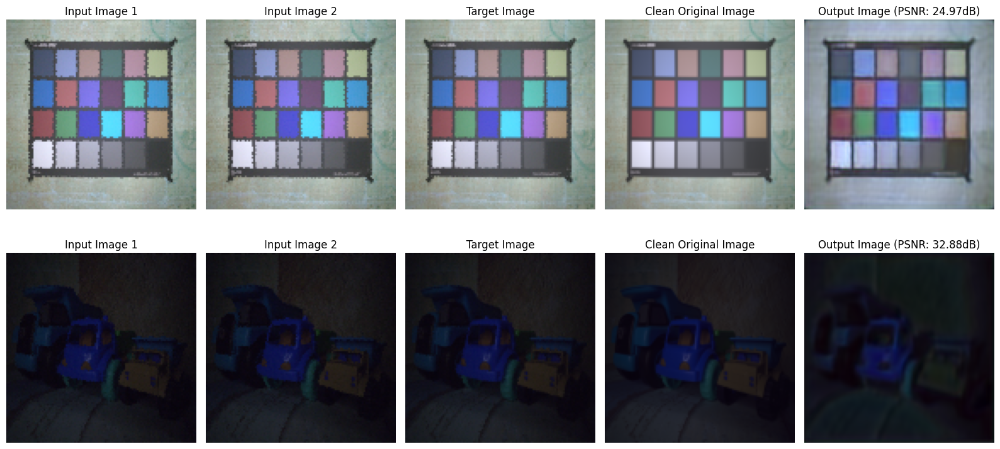

Epoch 76/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.07it/s]


Epoch 76/500 - Train Loss: 0.0027, Val Loss: 0.0025, Val PSNR: 28.46dB


Epoch 77/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.01it/s]


Epoch 77/500 - Train Loss: 0.0029, Val Loss: 0.0035, Val PSNR: 25.69dB


Epoch 78/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.02it/s]


Epoch 78/500 - Train Loss: 0.0027, Val Loss: 0.0030, Val PSNR: 26.36dB


Epoch 79/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.03it/s]


Epoch 79/500 - Train Loss: 0.0029, Val Loss: 0.0032, Val PSNR: 26.45dB


Epoch 80/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.05it/s]


Epoch 80/500 - Train Loss: 0.0033, Val Loss: 0.0031, Val PSNR: 25.96dB


Epoch 81/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 81/500 - Train Loss: 0.0023, Val Loss: 0.0016, Val PSNR: 29.58dB
모델 저장됨 (Val Loss: 0.0016)


Epoch 82/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.01it/s]


Epoch 82/500 - Train Loss: 0.0026, Val Loss: 0.0036, Val PSNR: 25.63dB


Epoch 83/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 83/500 - Train Loss: 0.0023, Val Loss: 0.0018, Val PSNR: 28.59dB


Epoch 84/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.04it/s]


Epoch 84/500 - Train Loss: 0.0019, Val Loss: 0.0017, Val PSNR: 29.30dB


Epoch 85/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.03it/s]


Epoch 85/500 - Train Loss: 0.0020, Val Loss: 0.0022, Val PSNR: 27.66dB


Epoch 86/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.06it/s]


Epoch 86/500 - Train Loss: 0.0020, Val Loss: 0.0019, Val PSNR: 28.67dB


Epoch 87/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.07it/s]


Epoch 87/500 - Train Loss: 0.0019, Val Loss: 0.0019, Val PSNR: 28.23dB


Epoch 88/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]


Epoch 88/500 - Train Loss: 0.0019, Val Loss: 0.0015, Val PSNR: 28.72dB
모델 저장됨 (Val Loss: 0.0015)


Epoch 89/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.05it/s]


Epoch 89/500 - Train Loss: 0.0021, Val Loss: 0.0018, Val PSNR: 29.58dB


Epoch 90/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.02it/s]


Epoch 90/500 - Train Loss: 0.0020, Val Loss: 0.0015, Val PSNR: 30.22dB
모델 저장됨 (Val Loss: 0.0015)


Epoch 91/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.09it/s]


Epoch 91/500 - Train Loss: 0.0018, Val Loss: 0.0017, Val PSNR: 29.01dB


Epoch 92/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]


Epoch 92/500 - Train Loss: 0.0018, Val Loss: 0.0014, Val PSNR: 30.40dB
모델 저장됨 (Val Loss: 0.0014)


Epoch 93/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 93/500 - Train Loss: 0.0018, Val Loss: 0.0022, Val PSNR: 28.33dB


Epoch 94/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 94/500 - Train Loss: 0.0022, Val Loss: 0.0038, Val PSNR: 27.90dB


Epoch 95/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 95/500 - Train Loss: 0.0023, Val Loss: 0.0034, Val PSNR: 27.08dB


Epoch 96/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 96/500 - Train Loss: 0.0019, Val Loss: 0.0021, Val PSNR: 27.86dB


Epoch 97/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 97/500 - Train Loss: 0.0024, Val Loss: 0.0046, Val PSNR: 27.40dB


Epoch 98/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 98/500 - Train Loss: 0.0020, Val Loss: 0.0029, Val PSNR: 26.74dB


Epoch 99/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 99/500 - Train Loss: 0.0020, Val Loss: 0.0014, Val PSNR: 29.85dB
모델 저장됨 (Val Loss: 0.0014)


Epoch 100/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 100/500 - Train Loss: 0.0018, Val Loss: 0.0014, Val PSNR: 30.05dB
모델 저장됨 (Val Loss: 0.0014)


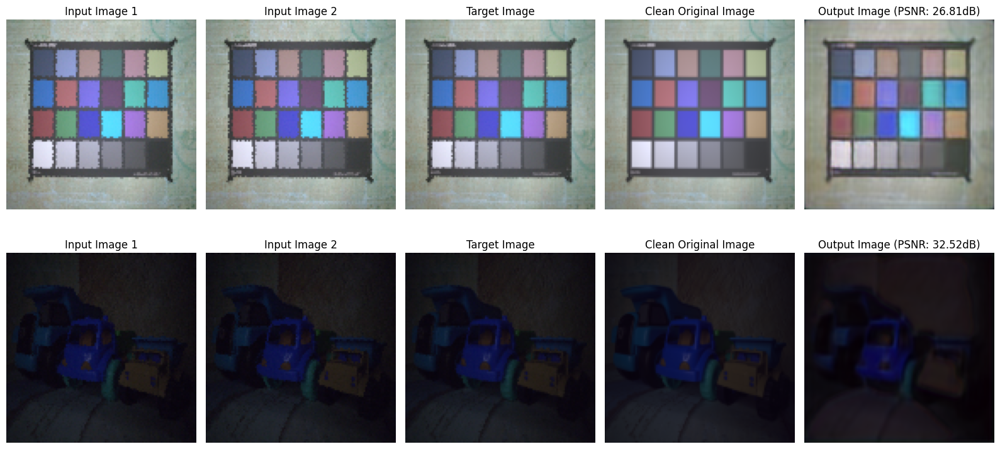

Epoch 101/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.87it/s]


Epoch 101/500 - Train Loss: 0.0019, Val Loss: 0.0019, Val PSNR: 27.74dB


Epoch 102/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 102/500 - Train Loss: 0.0020, Val Loss: 0.0017, Val PSNR: 29.12dB


Epoch 103/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]


Epoch 103/500 - Train Loss: 0.0023, Val Loss: 0.0018, Val PSNR: 29.34dB


Epoch 104/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 104/500 - Train Loss: 0.0019, Val Loss: 0.0016, Val PSNR: 28.65dB


Epoch 105/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 105/500 - Train Loss: 0.0022, Val Loss: 0.0022, Val PSNR: 28.07dB


Epoch 106/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 106/500 - Train Loss: 0.0017, Val Loss: 0.0016, Val PSNR: 29.10dB


Epoch 107/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 107/500 - Train Loss: 0.0021, Val Loss: 0.0016, Val PSNR: 29.74dB


Epoch 108/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.91it/s]


Epoch 108/500 - Train Loss: 0.0024, Val Loss: 0.0026, Val PSNR: 27.76dB


Epoch 109/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 109/500 - Train Loss: 0.0020, Val Loss: 0.0021, Val PSNR: 28.36dB


Epoch 110/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]


Epoch 110/500 - Train Loss: 0.0022, Val Loss: 0.0021, Val PSNR: 28.01dB


Epoch 111/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.88it/s]


Epoch 111/500 - Train Loss: 0.0021, Val Loss: 0.0021, Val PSNR: 28.54dB


Epoch 112/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 112/500 - Train Loss: 0.0022, Val Loss: 0.0029, Val PSNR: 27.42dB


Epoch 113/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 113/500 - Train Loss: 0.0019, Val Loss: 0.0019, Val PSNR: 28.82dB


Epoch 114/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 114/500 - Train Loss: 0.0019, Val Loss: 0.0014, Val PSNR: 30.16dB
모델 저장됨 (Val Loss: 0.0014)


Epoch 115/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 115/500 - Train Loss: 0.0020, Val Loss: 0.0026, Val PSNR: 27.83dB


Epoch 116/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 116/500 - Train Loss: 0.0017, Val Loss: 0.0024, Val PSNR: 28.04dB


Epoch 117/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 117/500 - Train Loss: 0.0019, Val Loss: 0.0013, Val PSNR: 30.60dB
모델 저장됨 (Val Loss: 0.0013)


Epoch 118/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 118/500 - Train Loss: 0.0022, Val Loss: 0.0021, Val PSNR: 28.10dB


Epoch 119/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 119/500 - Train Loss: 0.0020, Val Loss: 0.0027, Val PSNR: 26.23dB


Epoch 120/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 120/500 - Train Loss: 0.0018, Val Loss: 0.0021, Val PSNR: 27.89dB


Epoch 121/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 121/500 - Train Loss: 0.0016, Val Loss: 0.0019, Val PSNR: 27.90dB


Epoch 122/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 122/500 - Train Loss: 0.0018, Val Loss: 0.0024, Val PSNR: 28.81dB


Epoch 123/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 123/500 - Train Loss: 0.0020, Val Loss: 0.0013, Val PSNR: 30.40dB


Epoch 124/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]


Epoch 124/500 - Train Loss: 0.0022, Val Loss: 0.0019, Val PSNR: 29.59dB


Epoch 125/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 125/500 - Train Loss: 0.0021, Val Loss: 0.0023, Val PSNR: 27.52dB


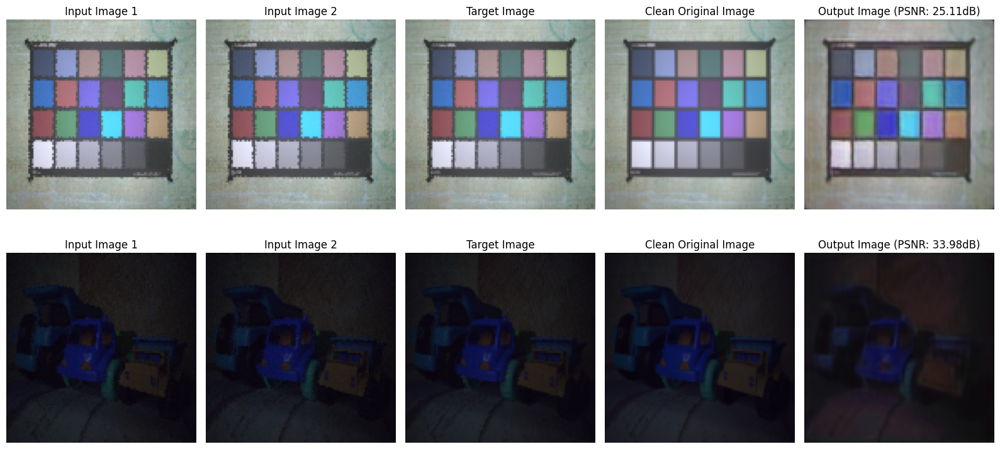

Epoch 126/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 126/500 - Train Loss: 0.0016, Val Loss: 0.0013, Val PSNR: 29.98dB


Epoch 127/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 127/500 - Train Loss: 0.0017, Val Loss: 0.0016, Val PSNR: 29.44dB


Epoch 128/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 128/500 - Train Loss: 0.0015, Val Loss: 0.0014, Val PSNR: 30.10dB


Epoch 129/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]


Epoch 129/500 - Train Loss: 0.0015, Val Loss: 0.0016, Val PSNR: 30.05dB


Epoch 130/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]


Epoch 130/500 - Train Loss: 0.0016, Val Loss: 0.0019, Val PSNR: 28.21dB


Epoch 131/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.92it/s]


Epoch 131/500 - Train Loss: 0.0018, Val Loss: 0.0024, Val PSNR: 28.23dB


Epoch 132/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 132/500 - Train Loss: 0.0018, Val Loss: 0.0032, Val PSNR: 26.19dB


Epoch 133/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.93it/s]


Epoch 133/500 - Train Loss: 0.0018, Val Loss: 0.0032, Val PSNR: 26.17dB


Epoch 134/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 134/500 - Train Loss: 0.0019, Val Loss: 0.0014, Val PSNR: 29.46dB


Epoch 135/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 135/500 - Train Loss: 0.0020, Val Loss: 0.0014, Val PSNR: 29.99dB


Epoch 136/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 136/500 - Train Loss: 0.0016, Val Loss: 0.0016, Val PSNR: 28.89dB


Epoch 137/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 137/500 - Train Loss: 0.0020, Val Loss: 0.0022, Val PSNR: 28.55dB


Epoch 138/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 138/500 - Train Loss: 0.0017, Val Loss: 0.0027, Val PSNR: 27.70dB


Epoch 139/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.95it/s]


Epoch 139/500 - Train Loss: 0.0016, Val Loss: 0.0016, Val PSNR: 29.33dB


Epoch 140/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]


Epoch 140/500 - Train Loss: 0.0017, Val Loss: 0.0021, Val PSNR: 28.16dB


Epoch 141/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.97it/s]


Epoch 141/500 - Train Loss: 0.0019, Val Loss: 0.0014, Val PSNR: 30.00dB


Epoch 142/500 [Val]: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]


Epoch 142/500 - Train Loss: 0.0019, Val Loss: 0.0019, Val PSNR: 28.52dB
조기 종료 (25 에폭 동안 검증 손실이 감소하지 않음)


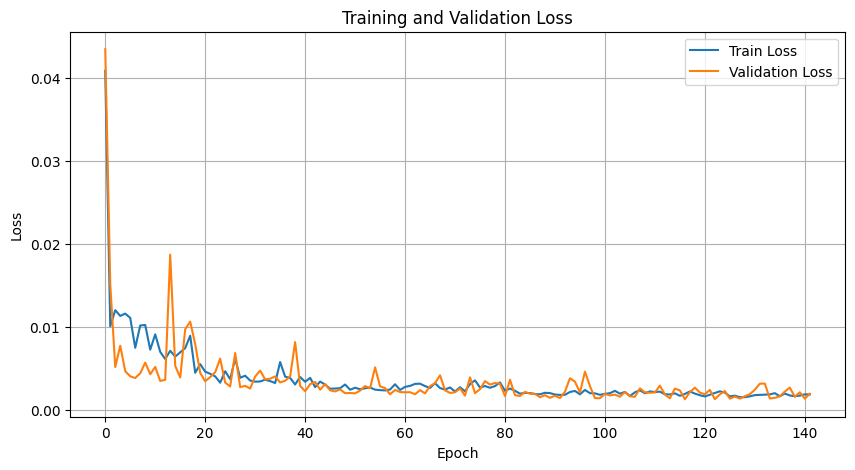

최종 모델 저장 완료: ./checkpoints\final_dncnn_model_ca.pth
최종 결과 시각화 중...


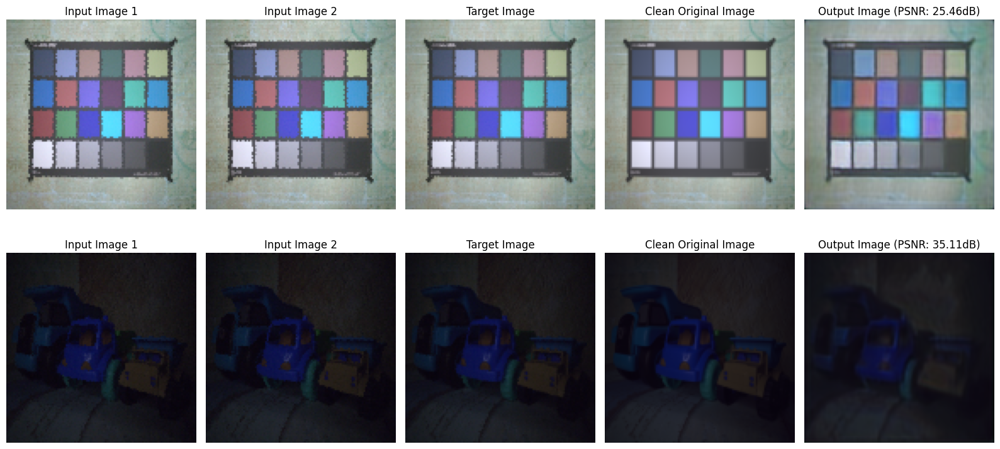

학습 및 평가 완료!


In [6]:
# 실행 코드
if __name__ == "__main__":
    # 하이퍼파라미터 설정
    num_epochs = num_epochs  # 학습 에폭 수
    batch_size = batch_size   # 배치 크기\
    learning_rate = learning_rate  # 학습률
    img_size = img_size  # 이미지 크기
    ca = 'ca'  # 'ca'로 설정하면 채널 어텐션 모델 사용
    early_stop = early_stop
    
    # 학습 실행
    model, train_losses, val_losses = main(
        num_epochs=num_epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        img_size=img_size,
        early_stop=early_stop,
        ca=ca
    )

사용 중인 디바이스: cuda


c:\Workspace\N2N_CA2\compare.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


=== SIDD_Dataset 초기화 (img_size=224) ===
캐시 파일을 로드합니다: ./dataset_cache\sidd_processed_224.pt
캐시 로드 완료. 소요 시간: 0.02초
데이터 크기: 160 샘플, 이미지 크기: 112x112
DnCNN 모델 평가 중...
./checkpoints/final_dncnn_model.pth 모델 불러오기 완료


모델 평가 중: 100%|██████████| 8/8 [00:00<00:00, 35.69it/s]


DnCNN 평균 PSNR: 28.82dB
DnCNN_ca 모델 평가 중...
./checkpoints/final_dncnn_model_ca.pth 모델 불러오기 완료


모델 평가 중: 100%|██████████| 8/8 [00:00<00:00, 13.70it/s]
c:\Workspace\N2N_CA2\compare.py:167: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) DejaVu Sans.
  plt.savefig('./checkpoints/psnr_comparison.png', dpi=300)
c:\Workspace\N2N_CA2\compare.py:167: UserWarning: Glyph 45944 (\N{HANGUL SYLLABLE DEL}) missing from font(s) DejaVu Sans.
  plt.savefig('./checkpoints/psnr_comparison.png', dpi=300)
c:\Workspace\N2N_CA2\compare.py:167: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.
  plt.savefig('./checkpoints/psnr_comparison.png', dpi=300)
c:\Workspace\N2N_CA2\compare.py:167: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) DejaVu Sans.
  plt.savefig('./checkpoints/psnr_comparison.png', dpi=300)
c:\Workspace\N2N_CA2\compare.py:167: UserWarning: Glyph 44368 (\N{HANGUL SYLLABLE GYO}) missing from font(s) DejaVu Sans.
  plt.savefig('./checkpoints/psnr_comparison.png', dpi=300)


DnCNN_ca 평균 PSNR: 28.43dB


c:\Users\pook0\.conda\envs\UM\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\pook0\.conda\envs\UM\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 45944 (\N{HANGUL SYLLABLE DEL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\pook0\.conda\envs\UM\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\pook0\.conda\envs\UM\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\pook0\.conda\envs\UM\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 44368 (\N{HANGUL SYLLABLE GYO}) missing from font(s) DejaVu Sans.
  fig.c

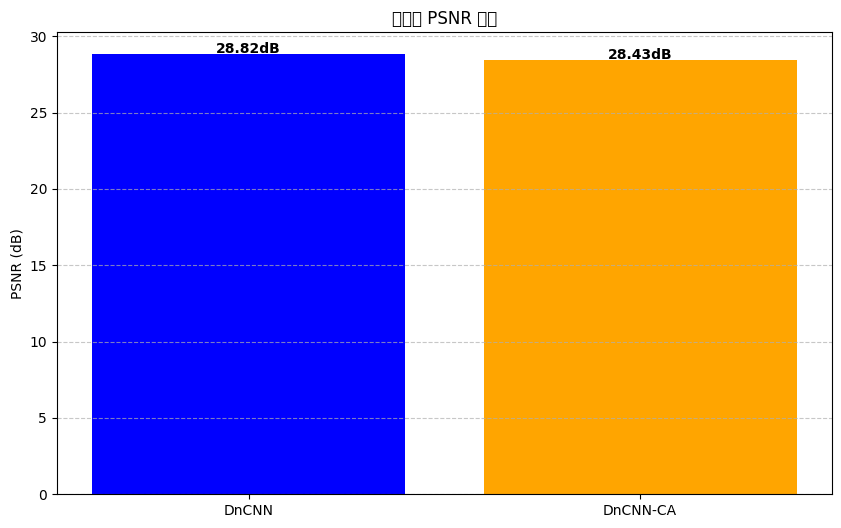

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0062769647..1.0000002].


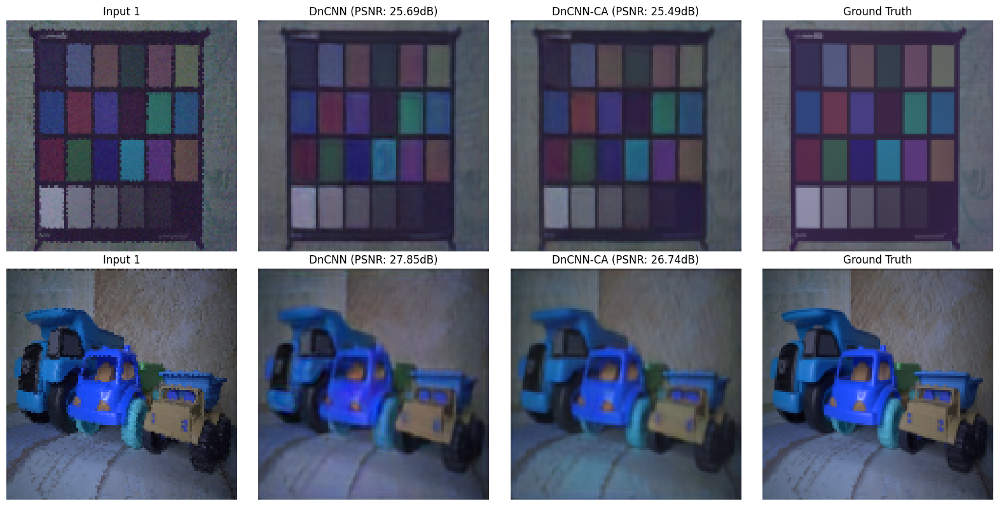

In [7]:
from compare import run_evaluation

img_size = 224
batch_size = 4
# 테스트 실행
run_evaluation(img_size=img_size, batch_size=batch_size)
